## Feature Engineering for Clustering Spatial Analysis 

## Utrecht Province – Shared Mobility & Housing Demand Clustering
This is part two of the feature engineering process. After employment and housing features were engineered in 3.0_feature_engineering_part_1, this notebook focuses on engineering features in groups 4-9: Shared Mobility Features, Mobility Hubs, OV-Fiets (Public Shared Bikes), Public Transport Lines, and Bike Networks. The goal is to prepare a geospatial dataset for cluster analysis using DBSCAN or HDBSCAN to optimize shared mobility infrastructure.

- All features were merged into a single GeoDataFrame "hex_all_features"

### Feature Engineering Summary

All engineered features were merged into a single GeoDataFrame for exploratory analysis. A total of 20 spatial indicators were created, including:

1. `hex_id`: Unique identifier for each hexagon  
2. `geometry`: Geometry of the hexagon  
3. `job_onsite`: Count of onsite jobs  
4. `job_hybrid`: Count of hybrid jobs  
5. `job_uncertain`: Count of uncertain-location jobs  
6. `job_total`: Total job count  
7. `job_weighted`: Weighted job count  
8. `housing_density_utrecht_2025`: Housing density in 2025  
9. `absolute_growth_utrecht_2025`: Absolute housing growth in 2025  
10. `planned_housing_units`: Planned housing units  
11. `planned_density_score`: Planned housing density score  
12. `avg_vehicle_availability`: Average shared mobility vehicle availability  
13. `is_covered_by_hub`: Flag indicating coverage by mobility hubs  
14. `distance_to_public_transport`: Distance to the nearest public transport line  
15. `distance_to_bike_network`: Distance to the nearest bike network  
16. `multimodal_access`: Flag for multimodal access (bike and public transport)  
17. `hub_score`: Score based on proximity to mobility hubs  
18. `ov_fiets_access`: Flag for OV-fiets access  
19. `avg_bike_availability`: Average availability of shared bikes  
20. `combined_bike_network_distance`: Minimum distance to direct or regional bike networks

These features were part of the **exploratory phase**. Only a subset was used in the **final clustering**, with some alterations to improve standardization and interpretability.

### Final Selected Features for Clustering

1. `job_weighted_log`: Log-transformed weighted job count  
2. `planned_housing_units_log`: Log-transformed planned housing units  
3. `housing_density_utrecht_2025_flag`: Binary flag for 2025 housing density (high = 1, low = 0)  
4. `pt_access_score`: Composite score based on distance to public transport  
5. `hub_overall_score`: Weighted score for proximity and quality of mobility hubs  
6. `has_ovfiets_access`: Binary flag for OV-fiets access  
7. `avg_vehicle_availability`: Used as a proxy for shared mobility availability  
8. `multimodal_access`: Used for reference, but excluded from UMAP due to binary structure

### 🔧 Transformations Applied 

- **Log transformations** were used on skewed variables (`job_weighted`, `planned_housing_units`) to stabilize variance.  
- **New features** were engineered (`pt_access_score`, `hub_overall_score`) using weighted scoring systems based on multimodality and hub types.  
- Some distance-based variables were removed or replaced to reduce redundancy and improve clustering performance.


In [27]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import csv
import os
import glob
from datetime import date
from geopy.distance import geodesic
import sys

## 1.0 Shared Mobility Features 

This section summarizes how shared vehicle availability and **OV-fiets public bike access** were integrated into the hex grid for further analysis and clustering.

* **Shared Mobility Points**: Aggregated vehicle locations (cars, bikes, scooters) from 4 datasets across morning and evening peak periods.
* **OV-fiets Stations**: Public bike station locations, mapped as binary access zones based on a 500m buffer.
* **Capped Availability**: Average availability per hex, capped at 5 to avoid dominance of high outliers.
* **Log Availability**: `log(1 + x)` transformation to normalize the distribution for clustering (HDBSCAN).

> ℹ️ Most hexagons show no shared mobility presence. The data is highly concentrated in city centers, especially Utrecht, Amersfoort, and select transit hubs.
> **OV-fiets** expands spatial coverage, particularly around train stations and mid-sized municipalities.




In [28]:
import sys
import os
import geopandas as gpd

# Get the parent directory (project root) relative to the notebook
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

from config import QGIS_DIR, OUTPUT_DIR

# Load hex grid features and hex grid for Utrecht
hex_all_features = gpd.read_file(QGIS_DIR / "hex_all_features_part1.gpkg")
hex_grid_utrecht = gpd.read_file(QGIS_DIR / "hex_grid_utrecht.gpkg")

### 1.1 Vehicle Availability (CROW)

In [29]:
import geopandas as gpd
import pandas as pd
import os
from pathlib import Path

# Try to import QGIS_DIR from config.py if available, otherwise fall back to environment variable or default
try:
    from config import QGIS_DIR
except ImportError:
    QGIS_DIR = Path(os.getenv("QGIS_DIR", "./data"))

def safe_read_gpkg(path, label=None):
    if not os.path.exists(path):
        print(f"⚠️ File not found for {label or 'file'}")
        return gpd.GeoDataFrame(geometry=[])
    try:
        gdf = gpd.read_file(path)
        # If CRS is not set, set it to 28992; otherwise, reproject to 28992
        if gdf.crs is None:
            gdf = gdf.set_crs(28992, allow_override=True)
        elif gdf.crs.to_epsg() != 28992:
            gdf = gdf.to_crs(28992)
        print(f"✅ Loaded {label or 'file'}")
        return gdf
    except Exception as e:
        print(f"⚠️ Error reading {label or 'file'}: {e}")
        return gpd.GeoDataFrame(geometry=[])

from config import QGIS_DIR

car_morning_path = QGIS_DIR / "shared_mobility_cars_point_displacement_0630_1000.gpkg"
car_evening_path = QGIS_DIR / "shared_mobility_cars_point_displacement_1600_2000.gpkg"
bike_scooter_morning_path = QGIS_DIR / "shared_mobility_bicycle_scooter_point_displacement_0630_1000.gpkg"
bike_scooter_evening_path = QGIS_DIR / "shared_mobility_bicycle_scooter_point_displacement_1600_2000.gpkg"

car_morning = safe_read_gpkg(car_morning_path, label="car morning data")
car_evening = safe_read_gpkg(car_evening_path, label="car evening data")
bike_scooter_morning = safe_read_gpkg(bike_scooter_morning_path, label="bike/scooter morning data")
bike_scooter_evening = safe_read_gpkg(bike_scooter_evening_path, label="bike/scooter evening data")

# Combine all point layers into one, ensuring all geometries are in EPSG:28992
vehicle_gdfs = []
for gdf in [car_morning, car_evening, bike_scooter_morning, bike_scooter_evening]:
    if gdf.crs is None:
        gdf = gdf.set_crs(28992, allow_override=True)
    elif gdf.crs.to_epsg() != 28992:
        gdf = gdf.to_crs(28992)
    vehicle_gdfs.append(gdf)

vehicles_all = gpd.GeoDataFrame(
    pd.concat(vehicle_gdfs, ignore_index=True),
    crs=28992
)

print("✅ All vehicle data combined.")

vehicles_all = vehicles_all.drop_duplicates(subset="geometry")
vehicles_all = vehicles_all[vehicles_all.geometry.notnull()]


✅ Loaded car morning data
✅ Loaded car evening data
✅ Loaded bike/scooter morning data
✅ Loaded bike/scooter evening data
✅ All vehicle data combined.


In [30]:
import numpy as np

# Calculate average vehicle availability per hex
if "avg_vehicle_availability" not in hex_all_features.columns:
    # 1. Combine all shared mobility vehicle points
    vehicles_all = gpd.GeoDataFrame(pd.concat([
        car_morning, car_evening, bike_scooter_morning, bike_scooter_evening
    ], ignore_index=True), crs=28992)

    # 2. Ensure 'available' column exists and is filled
    if "available" in vehicles_all.columns:
        vehicles_all["available"] = vehicles_all["available"].fillna(1)
    else:
        vehicles_all["available"] = 1

    # 3. Spatial join to hex grid
    vehicles_joined = gpd.sjoin(
        vehicles_all[["geometry", "available"]],
        hex_all_features[["hex_id", "geometry"]],
        how="left",
        predicate="intersects"
    )

    # 4. Group by hex and calculate average availability
    vehicle_availability = vehicles_joined.groupby("hex_id")["available"].mean().rename("avg_vehicle_availability")

    # 5. Merge back into main features
    hex_all_features = hex_all_features.merge(vehicle_availability, on="hex_id", how="left")
    hex_all_features["avg_vehicle_availability"] = hex_all_features["avg_vehicle_availability"].fillna(0)

# 6. For visual reporting
hex_all_features["capped_vehicle_availability"] = hex_all_features["avg_vehicle_availability"].clip(upper=5)

# 7. For clustering
hex_all_features["log_vehicle_availability"] = np.log1p(hex_all_features["avg_vehicle_availability"])

In [31]:
# ---- Global parameters for font type, sizes, titles, and figure sizes ----
FONT_FAMILY = "DejaVu Sans"
TITLE_FONT_SIZE = 24
LEGEND_FONT_SIZE = 11
LEGEND_TITLE_FONT_SIZE = 12
ANNOTATION_FONT_SIZE = 11
FIGSIZE_COMBINED = (44, 16)   # For side-by-side (1,2) plots
FIGSIZE_SINGLE = (22, 16)     # For single map plots

GLOBAL_FIGSIZE = FIGSIZE_SINGLE
GLOBAL_LABEL_FONTSIZE = ANNOTATION_FONT_SIZE
GLOBAL_TITLE_FONTSIZE = TITLE_FONT_SIZE
GLOBAL_CITY_LABEL_FONTSIZE = ANNOTATION_FONT_SIZE
GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT = ANNOTATION_FONT_SIZE + 5

# --- City coordinates for annotation ---
GLOBAL_CITY_COORDS = {
    "UTRECHT": (136784, 455860),
    "Amersfoort": (155041, 463103),
    "Nieuwegein": (133952, 448951),
    "Houten": (139963, 448940),
    "Zeist": (144446, 455827),
    "Veenendaal": (166571, 448709)
}

GLOBAL_CITY_LABEL_OFFSETS = {
    "UTRECHT": (0, 9000),
    "Zeist": (0, 9000),
    "Amersfoort": (8000, 4000),
    "Nieuwegein": (-8000, -5000),
    "Houten": (6000, -6000),
    "Veenendaal": (5000, 1000)
}

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import contextily as ctx
import os
from matplotlib.colors import ListedColormap
import matplotlib as mpl


def plot_vehicle_availability_map(
    gdf,
    base_column,
    basemap=True,
    city_labels=True,
    filename="vehicle_availability",
    cmap_base="magma",
    city_coords=None,
    city_label_offsets=None,
    show=True,
    figsize=None,
    title=None
):
    """
    Plots a single map:
    - Capped average vehicle availability (base_column)
    Includes optional basemap and city labels.
    Style follows the specification in the notebook header.
    Color scale: 0 is slightly darker (opaque), 0.5-5 is magma.
    Ensures the basemap is set to the correct CRS (Amersfoort / RD New, EPSG:28992).
    Returns the matplotlib Axes object.
    """
    # Use global parameters if not provided
    if figsize is None:
        figsize = GLOBAL_FIGSIZE
    if city_coords is None:
        city_coords = GLOBAL_CITY_COORDS
    if city_label_offsets is None:
        city_label_offsets = GLOBAL_CITY_LABEL_OFFSETS

    # 4. Figure Size: 20x10 inches (or global)
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # 2. Capped Availability Map
    bounds_capped = np.linspace(0, 5, 11)  # 0, 0.5, 1, ..., 5

    # Create a custom colormap: 0 is slightly darker and opaque, 0.5-5 is magma (from 0.5 to 5)
    n_colors = 256
    n_bins = len(bounds_capped) - 1
    n_0 = 1  # Only the first bin is for 0
    n_05_5 = n_bins - n_0  # The rest are for 0.5-5

    # Slightly darker and opaque grey for 0 (e.g. "#cccccc" with alpha=1)
    # RGB for #cccccc is (204,204,204)
    darker_opaque_grey = np.array([204/255, 204/255, 204/255, 1.0])

    # Accept both string and colormap for cmap_base
    if isinstance(cmap_base, str):
        magma = mpl.cm.get_cmap("magma")
    else:
        magma = cmap_base

    # Use magma colors from 0.5 to 1, but only for bins 0.5-5
    magma_colors = magma(np.linspace(0.5, 1, n_05_5))

    # Build the full colormap: first bin is darker opaque grey, rest is magma
    colors = np.vstack([
        np.tile(darker_opaque_grey, (n_0, 1)),
        magma_colors
    ])
    custom_cmap = ListedColormap(colors)

    # Set up normalization: 0-0.5 is all darker opaque grey, 0.5-5 is magma
    norm_capped = mpl.colors.BoundaryNorm(boundaries=bounds_capped, ncolors=custom_cmap.N)

    # Optional basemap: draw first, covering the full figure extent
    if basemap:
        try:
            amersfoort_crs = "EPSG:28992"
            gdf_crs = gdf.crs.to_string() if gdf.crs else None
            if gdf_crs != amersfoort_crs:
                print(f"⚠️ Project CRS is {gdf_crs}, reprojecting to {amersfoort_crs} for basemap display.")
                gdf_for_basemap = gdf.to_crs(amersfoort_crs)
            else:
                gdf_for_basemap = gdf
            # Get the total bounds of the data for the basemap
            xmin, ymin, xmax, ymax = gdf_for_basemap.total_bounds
            # Set the axis limits to the data bounds before adding the basemap
            ax.set_xlim(xmin, xmax)
            ax.set_ylim(ymin, ymax)
            ctx.add_basemap(
                ax,
                source=ctx.providers.CartoDB.Positron,
                crs=amersfoort_crs,
                alpha=1
            )
        except Exception as e:
            print(f"⚠️ Could not add basemap: {e}")

    # Plot hexes with a very thin grey outline, on top of the basemap
    gdf.plot(
        column=base_column,
        cmap=custom_cmap,
        ax=ax,
        edgecolor="#e0e0e0",  # very thin grey outline
        linewidth=0.2,
        norm=norm_capped,
        zorder=2
    )
    sm1 = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm_capped)
    sm1._A = []
    cb1 = plt.colorbar(sm1, ax=ax, fraction=0.03, pad=0.04, ticks=bounds_capped)
    cb1.set_label("Capped Avg. Vehicle Availability (max=5)", fontsize=GLOBAL_LABEL_FONTSIZE, family=FONT_FAMILY)
    if title is None:
        title = "Capped Vehicle Availability"
    ax.set_title(title, fontsize=GLOBAL_TITLE_FONTSIZE, family=FONT_FAMILY)

    # Optional city labels (no dots at centroids)
    if city_labels:
        for city, (x, y) in city_coords.items():
            dx, dy = city_label_offsets.get(city, (0, 5000))
            arrowprops = dict(arrowstyle='-', color="#444444", lw=0.8)
            ax.annotate(
                city,
                xy=(x, y),
                xytext=(x + dx, y + dy),
                textcoords="data",
                fontsize=GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT if city == "UTRECHT" else GLOBAL_CITY_LABEL_FONTSIZE,
                fontweight="bold",
                ha="center",
                va="center",
                bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7, lw=0),
                arrowprops=arrowprops,
                fontfamily=FONT_FAMILY
            )

    ax.axis("off")

    plt.tight_layout()
    output_dir = os.path.join("0.0_outputs", "shared_mobility")
    os.makedirs(output_dir, exist_ok=True)
    plt.savefig(os.path.join(output_dir, f"{filename}.png"), dpi=300, bbox_inches="tight")
    if show:
        plt.show()
    return ax

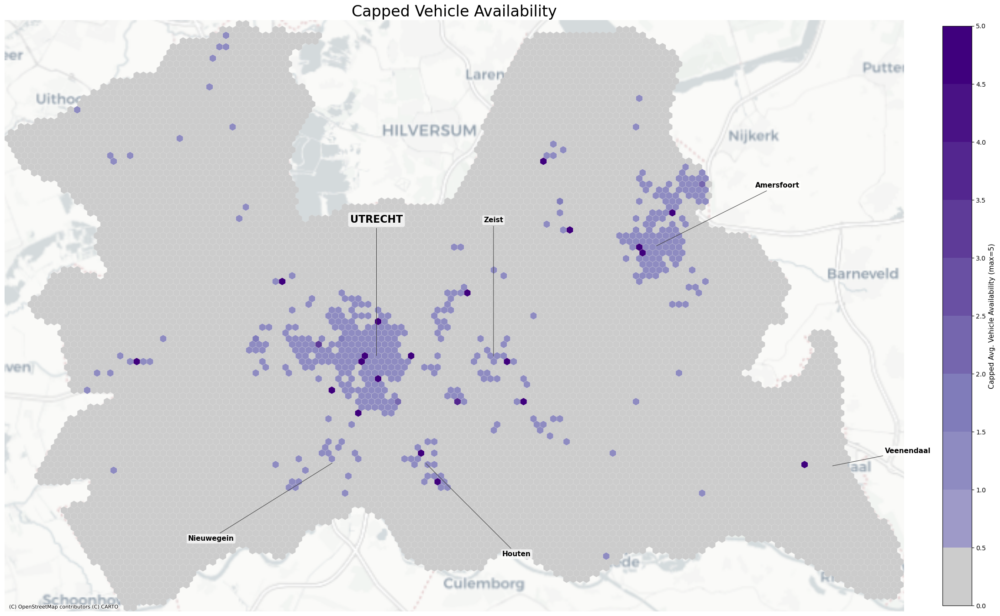

In [33]:
import matplotlib.pyplot as plt

# Ensure the colormap is retrieved using the new recommended method
cmap = plt.colormaps["magma_r"]

ax = plot_vehicle_availability_map(
    gdf=hex_all_features,
    base_column='capped_vehicle_availability',
    basemap=True,
    city_labels=True,
    filename="vehicle_availability_map",
    cmap_base=plt.colormaps["Purples"],  # Purples: light to dark purple
    city_coords=None,
    show=True  # Assume the function supports this, or comment out plt.show() inside
)

### 1.2 OV-Fiets Hubs (public shared bicycle)

In [34]:
# Use QGIS_DIR from config to construct the file path
ovfiets_hubs_path = os.path.join(
    QGIS_DIR,
    "shared_mobility_bicycles_ovfiets_hubs.gpkg"
)
ovfiets_hubs = gpd.read_file(ovfiets_hubs_path).to_crs(28992)

In [35]:
# Step 1: Create buffer around each OV-fiets hub (adjust distance as needed)
ovfiets_buffer = ovfiets_hubs.copy()
ovfiets_buffer["geometry"] = ovfiets_buffer.buffer(500)

# Step 2: Check which hexes are within that buffer
hex_all_features["has_ovfiets_access"] = hex_all_features.centroid.within(ovfiets_buffer.unary_union)

hex_all_features["has_ovfiets_access"] = hex_all_features["has_ovfiets_access"].astype(int)


C:\Users\manoe.MC_ASUS\AppData\Local\Temp\ipykernel_6140\3219036455.py:6: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  hex_all_features["has_ovfiets_access"] = hex_all_features.centroid.within(ovfiets_buffer.unary_union)


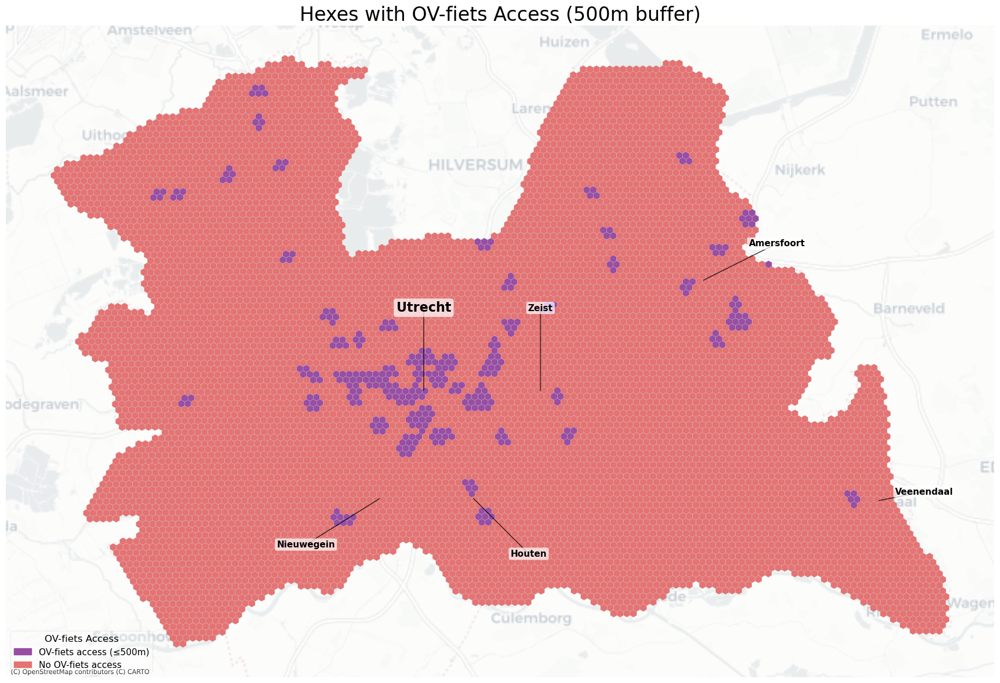

In [36]:
import matplotlib.pyplot as plt
import os
import contextily as ctx
import matplotlib.patches as mpatches
from config import OUTPUT_DIR

# --- Import plotting globals ---
from plotting_globals import (
    GLOBAL_FIGSIZE,
    GLOBAL_TITLE_FONTSIZE,
    GLOBAL_CITY_LABEL_FONTSIZE,
    GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT,
    GLOBAL_CITY_COORDS,
    GLOBAL_CITY_LABEL_OFFSETS,
    LEGEND_FONT_SIZE,
    LEGEND_TITLE_FONT_SIZE,
    FONT_FAMILY,
)

# Define short labels for cities (if not already defined)
city_short_labels = {
    "UTRECHT": "Utrecht",
    "Amersfoort": "Amersfoort",
    "Nieuwegein": "Nieuwegein",
    "Houten": "Houten",
    "Zeist": "Zeist",
    "Veenendaal": "Veenendaal",
}

ovfiets_access_colors = {
    1: "#984ea3",  # OV-fiets access (purple, opaque)
    0: "#e57373",  # No OV-fiets access (subtle red, semi-opaque)
}

# Ensure the output directory exists
output_subdir = os.path.join(OUTPUT_DIR, "mobility_hubs")
os.makedirs(output_subdir, exist_ok=True)

fig, ax = plt.subplots(figsize=GLOBAL_FIGSIZE)

# Map the has_ovfiets_access values to colors
hex_all_features["ovfiets_access_color"] = hex_all_features["has_ovfiets_access"].map(ovfiets_access_colors)

# Set hex outline to light grey
hex_all_features.plot(
    color=hex_all_features["ovfiets_access_color"],
    ax=ax,
    edgecolor="#cccccc",  # light grey outline
    linewidth=0.2,
    legend=False,
    zorder=10
)

# Add basemap using CartoDB.Positron
try:
    # If not already in Web Mercator, convert for basemap
    if hex_all_features.crs.to_epsg() != 3857:
        hex_all_features_webmerc = hex_all_features.to_crs(epsg=3857)
        ax.clear()
        hex_all_features_webmerc.plot(
            color=hex_all_features_webmerc["ovfiets_access_color"],
            ax=ax,
            edgecolor="#cccccc",
            linewidth=0.2,
            legend=False,
            zorder=10
        )
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=hex_all_features_webmerc.crs.to_string(), alpha=0.5)
        crs_for_labels = 3857
    else:
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=hex_all_features.crs.to_string(), alpha=0.5)
        crs_for_labels = hex_all_features.crs.to_epsg()
except Exception as e:
    print(f"⚠️ Basemap error: {e}")
    crs_for_labels = hex_all_features.crs.to_epsg()

# Custom legend - place at bottom left, white background, 25% transparency, on top of hexes
legend_handles = [
    mpatches.Patch(color=ovfiets_access_colors[1], label="OV-fiets access (≤500m)"),
    mpatches.Patch(color=ovfiets_access_colors[0], label="No OV-fiets access"),
]
legend = ax.legend(
    handles=legend_handles,
    loc="lower left",
    fontsize=LEGEND_FONT_SIZE,
    frameon=True,
    facecolor="white",
    framealpha=0.25,
    title="OV-fiets Access",
    title_fontsize=LEGEND_TITLE_FONT_SIZE
)
legend.set_zorder(30)  # Ensure legend is above hexes

ax.set_title("Hexes with OV-fiets Access (500m buffer)", fontsize=GLOBAL_TITLE_FONTSIZE)
ax.set_axis_off()

# Add city labels using global parameters
font_family = FONT_FAMILY

# If we reprojected, also reproject city label coordinates
city_coords_proj = {}
if crs_for_labels == 3857:
    import pyproj
    from pyproj import Transformer
    transformer = Transformer.from_crs(28992, 3857, always_xy=True)
    for city, (x, y) in GLOBAL_CITY_COORDS.items():
        city_coords_proj[city] = transformer.transform(x, y)
else:
    city_coords_proj = GLOBAL_CITY_COORDS

for city, (x, y) in city_coords_proj.items():
    dx, dy = GLOBAL_CITY_LABEL_OFFSETS.get(city, (0, 0))
    label = city_short_labels.get(city, city)
    # Draw offset line if offset is not (0,0)
    if dx != 0 or dy != 0:
        ax.annotate(
            "", xy=(x + dx, y + dy), xytext=(x, y),
            arrowprops=dict(arrowstyle="-", color="black", lw=1.2, alpha=0.7),
            zorder=19
        )
    # Plot the offset label (the main label with offset, in black)
    fontsize = GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT if city == "UTRECHT" else GLOBAL_CITY_LABEL_FONTSIZE
    ax.text(
        x + dx, y + dy, label,
        fontsize=fontsize, fontweight="bold", color="black",
        ha="center", va="center", bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", boxstyle="round,pad=0.2"),
        zorder=20, family=font_family
    )

plt.show()

# Save the figure to the output directory defined in config.py (OUTPUT_DIR)
output_path = os.path.join(OUTPUT_DIR, "vfiets_access.png")
fig.savefig(output_path, bbox_inches="tight", dpi=150)
plt.close(fig)


# 2.0 Existing Mobility Hubs Feature

This section summarizes how proximity and hierarchy of **mobility hubs** were integrated into the hex grid as structured features for clustering.

#### Mobility Hub Typology

| **Score** | **Hub Type**                   | **Dutch Name**                       | **Description**                                                  |
| --------- | ------------------------------ | ------------------------------------ | ---------------------------------------------------------------- |
| 5         | Megastation                    | Megastation                          | Major national/international station with extensive connections. |
| 4         | Intercity Station              | Intercitystation                     | Key regional station serving intercity and local trains.         |
| 3         | Regional Hub / Urban Hub       | Regionaal knooppunt / Stedelijke hub | Medium-scale hub connecting regional/urban transit modes.        |
| 2         | Local Train Station / Stop Hub | Stoptreinstation / Halteknoop        | Small station serving local or commuter trains.                  |
| 1         | P+R Hub / Local Hub            | P+R hub / Lokale hub                 | Local facility connecting parking, bus, or tram services.        |




* **Mobility Hubs**: Includes 64 locations across the province, classified by their function (e.g., megastation, local hub) and linked to a score from 1 to 5.
* **Distance-Based Scoring**:

  * Each hexagon received a **hub\_distance\_score** based on its distance to the nearest hub:

    * **4** if within 500m
    * **3** if within 1000m
    * **2** if within 2000m
    * **1** if further than 2000m
* **Hierarchy-Based Scoring**:

  * Each hex received a **hub\_type\_score** if it contained one or more hubs, based on the highest hierarchy score present (1–5).
  * If a hex had only one score (e.g., distance but no hub), the other score was boosted to 1 to avoid zeros in additive scoring.
* **Combined Score**:

  * **hub\_overall\_score** = `hub_distance_score + hub_type_score`
  * This results in values from **2 to 9**, reflecting both **coverage** and **intensity** of hub infrastructure.

> ℹ️ Hub coverage is most concentrated in urban centers (Utrecht, Amersfoort) but also extends into secondary cities and P+R zones. Higher scores (6–9) indicate areas with close proximity to high-hierarchy hubs.


In [37]:
from config import QGIS_DIR

hubs = gpd.read_file(
    os.path.join(QGIS_DIR, "mobility_nodes.gpkg")
).to_crs(28992)

Figure exported


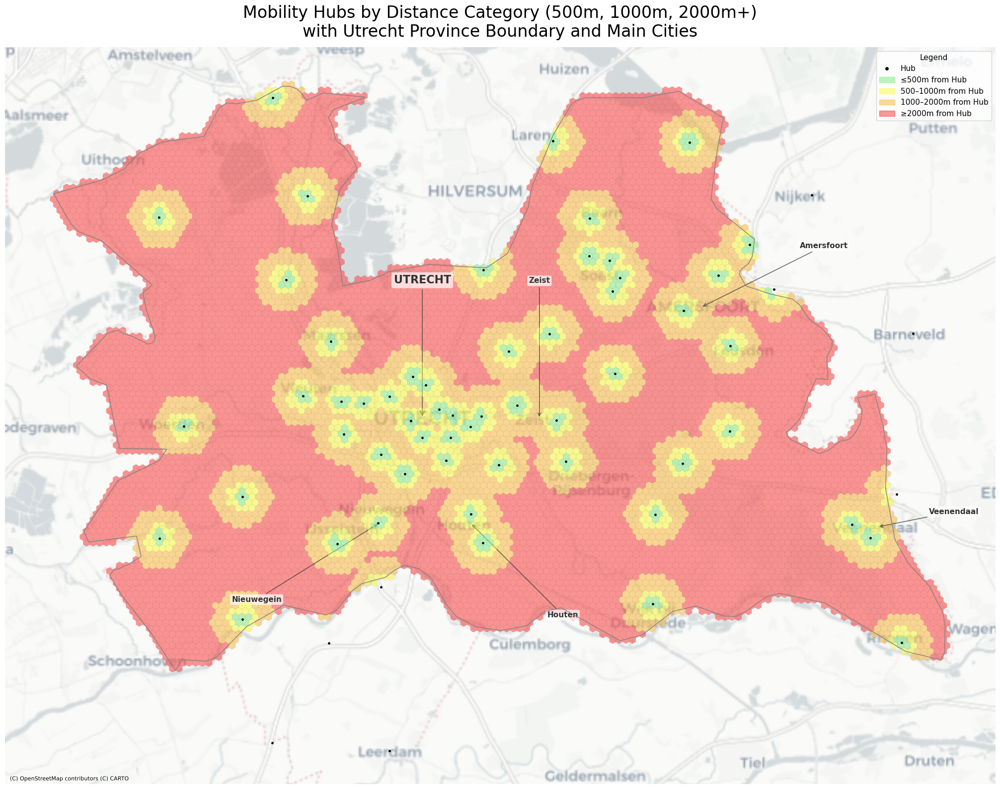

In [38]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import contextily as ctx
from config import QGIS_DIR, OUTPUT_DIR
from plotting_globals import (
    GLOBAL_FIGSIZE,
    GLOBAL_LABEL_FONTSIZE,
    GLOBAL_TITLE_FONTSIZE,
    GLOBAL_CITY_LABEL_FONTSIZE,
    GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT,
    GLOBAL_CITY_COORDS,
    GLOBAL_CITY_LABEL_OFFSETS,
    FONT_FAMILY
)

# Function: return hexes within a certain buffer around hubs
def hexes_within_buffer(hexes, hubs, radius):
    buffer_union = hubs.buffer(radius).union_all()
    return hexes[hexes.centroid.within(buffer_union)]

# Step 1: Get covered hexes
covered_500 = hexes_within_buffer(hex_all_features, hubs, 500)
covered_1000 = hexes_within_buffer(hex_all_features, hubs, 1000)
covered_2000 = hexes_within_buffer(hex_all_features, hubs, 2000)

# Step 2: Assign exclusive ranges
hexes_500 = covered_500
hexes_1000 = covered_1000[~covered_1000.index.isin(covered_500.index)]
hexes_2000 = covered_2000[~covered_2000.index.isin(covered_1000.index)]
hexes_2000plus = hex_all_features[~hex_all_features.index.isin(covered_2000.index)]

# --- Load province boundaries and main cities  ---

# Load province boundaries (province_boundaries.gpkg)
province_boundaries = gpd.read_file(
    os.path.join(QGIS_DIR, "province_boundaries.gpkg")
).to_crs(hex_all_features.crs)

# Select Utrecht province by name (adjust column name as needed)
if "name" in province_boundaries.columns:
    utrecht_boundary = province_boundaries[province_boundaries["name"].str.lower().str.contains("utrecht")]
elif "provincienaam" in province_boundaries.columns:
    utrecht_boundary = province_boundaries[province_boundaries["provincienaam"].str.lower().str.contains("utrecht")]
else:
    raise ValueError("Could not find a column for province name in province_boundaries.gpkg")

# --- City coordinates for annotation ---
city_coords = GLOBAL_CITY_COORDS
label_offsets = GLOBAL_CITY_LABEL_OFFSETS

# --- Plot ---
fig, ax = plt.subplots(figsize=GLOBAL_FIGSIZE)
plt.rcParams["font.family"] = FONT_FAMILY

# Hex layers in color order, 40% transparent, with a very thin outline
hex_all_features.plot(ax=ax, color="#f0f0f0", edgecolor="grey", linewidth=0.1, zorder=1, alpha=0.4)
hexes_2000plus.plot(ax=ax, facecolor="red", edgecolor="black", linewidth=0.05, alpha=0.4, zorder=2)
hexes_2000.plot(ax=ax, facecolor="orange", edgecolor="black", linewidth=0.05, alpha=0.4, zorder=3)
hexes_1000.plot(ax=ax, facecolor="yellow", edgecolor="black", linewidth=0.05, alpha=0.4, zorder=4)
hexes_500.plot(ax=ax, facecolor="lightgreen", edgecolor="black", linewidth=0.05, alpha=0.6, zorder=5)

# Hubs
hubs.plot(ax=ax, color="black", markersize=6, zorder=6)

# Utrecht province boundary (no blue line, just boundary for context)
utrecht_boundary.boundary.plot(ax=ax, color="grey", linewidth=1, zorder=10, label="Utrecht Province Boundary")

# --- Plot city labels on the map ---
for city, (x, y) in city_coords.items():
    dx, dy = label_offsets.get(city, (0, 0))
    fontsize = GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT if city.upper() == "UTRECHT" else GLOBAL_CITY_LABEL_FONTSIZE
    ax.annotate(
        city,
        xy=(x, y),
        xytext=(x + dx, y + dy),
        textcoords='data',
        fontsize=fontsize,
        fontweight='bold',
        color='#333333',
        ha='center',
        va='center',
        bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7, ec="none"),
        arrowprops=dict(arrowstyle="->", color="#333333", lw=1.2, alpha=0.7)
    )

# Basemap
try:
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=hex_all_features.crs)
except Exception as e:
    print("Basemap error:", e)

# Final polish
ax.set_title(
    "Mobility Hubs by Distance Category (500m, 1000m, 2000m+)\nwith Utrecht Province Boundary and Main Cities",
    fontsize=GLOBAL_TITLE_FONTSIZE, pad=15, fontfamily=FONT_FAMILY
)
ax.axis("off")

# Legend (remove blue boundary line from legend)
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hub', markerfacecolor='black', markersize=6),
    mpatches.Patch(color="lightgreen", alpha=0.6, label='≤500m from Hub'),
    mpatches.Patch(color="yellow", alpha=0.4, label='500–1000m from Hub'),
    mpatches.Patch(color="orange", alpha=0.4, label='1000–2000m from Hub'),
    mpatches.Patch(color="red", alpha=0.4, label='≥2000m from Hub'),
    # Removed blue boundary line from legend
]
ax.legend(
    handles=legend_elements,
    loc='upper right',
    title="Legend",
    fontsize=GLOBAL_LABEL_FONTSIZE,
    title_fontsize=GLOBAL_LABEL_FONTSIZE,
    frameon=True
)

plt.tight_layout()
# Export the current figure to the OUTPUT_DIR as a high-resolution PNG

# Create a folder called 'mobility_hubs' in OUTPUT_DIR if it doesn't exist
mobility_hubs_dir = OUTPUT_DIR / "mobility_hubs"
mobility_hubs_dir.mkdir(parents=True, exist_ok=True)

output_path = mobility_hubs_dir / "mobility_hubs_buffer.png"
plt.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Figure exported")


### 2.1 Types of HUBS

In [39]:
# Show unique combinations of hub type columns for inspection
hubs[["FUNCTIEMNK", "NIEUW_CAT", "TYPE_TOEK", "TYPE_PU", "TYPE_"]].drop_duplicates().head(10)

,FUNCTIEMNK,NIEUW_CAT,TYPE_TOEK,TYPE_PU,TYPE_
0,Regio,Regio Knooppunt,Regio knooppunt,Regio knooppunt,Stoptreinstation
1,Regio,Regio Knooppunt,Regio knooppunt,Regio knooppunt,Knooppuntstoptreinstation
2,Regio,Regio Knooppunt,Regio knooppunt,Lokaal knooppunt,Stoptreinstation
5,Landelijk,,Landelijk knooppunt,Landelijk knooppunt,Megastation
6,,,Lokaal knooppunt,Lokaal knooppunt,Knooppuntstoptreinstation
7,,,Lokaal knooppunt,Halteknoop,Stoptreinstation
8,,,Lokaal knooppunt,Lokaal knooppunt,Stoptreinstation
9,,,Regio knooppunt,Lokaal knooppunt,Stoptreinstation
10,,,Halteknoop,Halteknoop,Knooppuntstoptreinstation
13,Stedelijk,,Stedelijk knooppunt,Stedelijk knooppunt,Knooppuntstoptreinstation


In [40]:
# Normalize text (lowercase for matching)
for col in ["TYPE_TOEK", "TYPE_PU", "TYPE_", "FUNCTIEMNK"]:
    hubs[col] = hubs[col].fillna("").str.lower()

# Flag logic
hubs["is_megastation"] = hubs["TYPE_TOEK"].str.contains("megastation|metropool", na=False)
hubs["is_intercity_station"] = hubs["TYPE_"].str.contains("intercity", na=False)
hubs["is_regio_knooppunt"] = hubs["TYPE_TOEK"].str.contains("regio knooppunt", na=False)
hubs["is_stedelijk_hub"] = hubs["TYPE_TOEK"].str.contains("stedelijk", na=False)
hubs["is_stoptreinstation"] = hubs["TYPE_"].str.contains("stoptreinstation|knooppuntstop", na=False)
hubs["is_halteknoop"] = hubs["TYPE_TOEK"].str.contains("halteknoop", na=False)
hubs["is_pr_hub"] = hubs["FUNCTIEMNK"].str.contains("p\+r", na=False)
hubs["is_local_hub"] = hubs["TYPE_TOEK"].str.contains("lokaal knooppunt", na=False)

hubs["hub_type_score"] = (
    5 * hubs["is_megastation"].astype(int) +
    4 * hubs["is_intercity_station"].astype(int) +
    3 * (hubs["is_regio_knooppunt"] + hubs["is_stedelijk_hub"]).astype(int) +
    2 * (hubs["is_stoptreinstation"] + hubs["is_halteknoop"]).astype(int) +
    1 * (hubs["is_pr_hub"] + hubs["is_local_hub"]).astype(int)
)

# Clip and fill just in case
hubs["hub_type_score"] = hubs["hub_type_score"].clip(upper=5).fillna(0).astype(int)

print(hubs["hub_type_score"].value_counts())



hub_type_score
3    20
5    18
1    15
2     8
4     2
0     1
Name: count, dtype: int64


<>:12: SyntaxWarning: invalid escape sequence '\+'
<>:12: SyntaxWarning: invalid escape sequence '\+'
C:\Users\manoe.MC_ASUS\AppData\Local\Temp\ipykernel_6140\2339073257.py:12: SyntaxWarning: invalid escape sequence '\+'
  hubs["is_pr_hub"] = hubs["FUNCTIEMNK"].str.contains("p\+r", na=False)


In [41]:

# === 1. Compute hub_type_score ===
# Ensure all required columns exist in hubs, fill with 0 if missing
hub_type_columns = [
    ("is_megastation", 5),
    ("is_intercity_station", 4),
    ("is_regio_knooppunt", 3),
    ("is_stedelijk_hub", 3),
    ("is_stoptreinstation", 2),
    ("is_halteknoop", 2),
    ("is_pr_hub", 1),
    ("is_local_hub", 1)
]

for col, _ in hub_type_columns:
    if col not in hubs.columns:
        hubs[col] = 0

# Calculate hub_type_score as weighted sum of indicator columns
hubs["hub_type_score"] = 0
for col, weight in hub_type_columns:
    hubs["hub_type_score"] += hubs[col].astype(int) * weight

# === 2. Spatial join: assign hub_type_score to hex grid ===
hubs_type_joined = gpd.sjoin(
    hex_all_features[["hex_id", "geometry"]],
    hubs[["geometry", "hub_type_score"]],
    how="left",
    predicate="intersects"
)

# === 3. Group by hex_id and sum scores if multiple hubs fall in one hex ===
hub_type_by_hex = hubs_type_joined.groupby("hex_id", as_index=False)["hub_type_score"].sum()

# === 4. Merge into hex_all_features, avoiding duplicate columns ===
# Drop hub_type_score from hex_all_features if it already exists to avoid merge conflict
if "hub_type_score" in hex_all_features.columns:
    hex_all_features = hex_all_features.drop(columns=["hub_type_score"])

hex_all_features = hex_all_features.merge(hub_type_by_hex, on="hex_id", how="left")
hex_all_features["hub_type_score"] = hex_all_features["hub_type_score"].fillna(0).astype(int)


✅ Exported as mobility_hubs_hierarchy.png


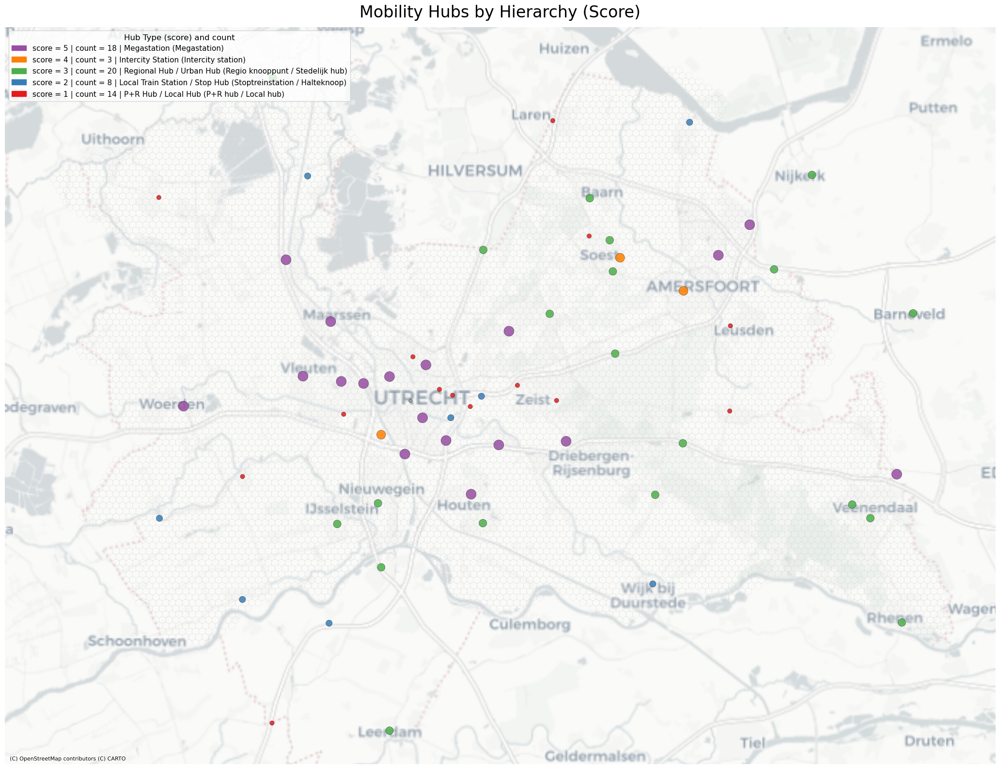

In [42]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import contextily as ctx
from matplotlib.lines import Line2D

# Import global plotting parameters
from plotting_globals import (
    FONT_FAMILY,
    TITLE_FONT_SIZE,
    LEGEND_FONT_SIZE,
    LEGEND_TITLE_FONT_SIZE,
    ANNOTATION_FONT_SIZE,
    GLOBAL_FIGSIZE
)

def plot_hub_hierarchy_map(hubs, hex_grid, save_path=None):
    """
    Plots hubs colored and sized by 'hub_type_score' on top of hex grid.
    Includes basemap and summary statistics.
    """
    # --- Clean and clip hub scores ---
    hubs["hub_type_score"] = hubs["hub_type_score"].clip(upper=5).fillna(0).astype(int)

    # --- Visual maps ---
    color_map = {
        1: "#e41a1c",  # Red
        2: "#377eb8",  # Blue
        3: "#4daf4a",  # Green
        4: "#ff7f00",  # Orange
        5: "#984ea3"   # Purple
    }
    # Make the hubs 1.5x bigger
    size_map = {
        1: 30 * 1.5, 2: 60 * 1.5, 3: 90 * 1.5, 4: 120 * 1.5, 5: 150 * 1.5
    }

    hub_colors = hubs["hub_type_score"].map(color_map).fillna("#999999").to_numpy()
    hub_sizes = hubs["hub_type_score"].map(size_map).fillna(20 * 1.5).to_numpy()

    # --- Hub legend ---
    hub_type_legend = {
        5: ("Megastation", "Megastation"),
        4: ("Intercity Station", "Intercity station"),
        3: ("Regional Hub / Urban Hub", "Regio knooppunt / Stedelijk hub"),
        2: ("Local Train Station / Stop Hub", "Stoptreinstation / Halteknoop"),
        1: ("P+R Hub / Local Hub", "P+R hub / Local hub")
    }

    # --- Compute stats ---
    hub_counts = hubs["hub_type_score"].value_counts().sort_index()
    total_hubs = len(hubs)
    stats_lines = [f"Total hubs: {total_hubs}"]
    for score in sorted(hub_type_legend.keys(), reverse=True):
        count = hub_counts.get(score, 0)
        eng, dut = hub_type_legend[score]
        stats_lines.append(f"{eng}: {count}")

    stats_text = "\n".join(stats_lines)

    # --- Plot ---
    fig, ax = plt.subplots(figsize=GLOBAL_FIGSIZE)
    plt.rcParams["font.family"] = FONT_FAMILY

    hex_grid.boundary.plot(ax=ax, color="lightgray", linewidth=0.2, zorder=1)

    # Hubs as scatter (fallback to centroids if needed)
    hub_geom = hubs.geometry.centroid if not hubs.geometry.geom_type.isin(['Point']).all() else hubs.geometry
    ax.scatter(
        hub_geom.x,
        hub_geom.y,
        c=hub_colors,
        s=hub_sizes,
        alpha=0.85,
        edgecolor="black",
        linewidth=0.3,
        zorder=3
    )

    # --- Basemap ---
    try:
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=hubs.crs.to_string(), alpha=1, zorder=0)
    except Exception as e:
        print("⚠️ Basemap error:", e)

    # --- Legend with stats ---
    present_scores = hubs["hub_type_score"].unique()
    legend_handles = []
    for score, (eng, dut) in hub_type_legend.items():
        if score in present_scores:
            count = hub_counts.get(score, 0)
            label = f"score = {score} | count = {count} | {eng} ({dut})"
            legend_handles.append(mpatches.Patch(color=color_map[score], label=label))
    ax.legend(
        handles=legend_handles,
        title="Hub Type (score) and count",
        loc="upper left",
        fontsize=LEGEND_FONT_SIZE,
        title_fontsize=LEGEND_TITLE_FONT_SIZE,
        frameon=True
    )

    # --- Final polish ---
    ax.set_title("Mobility Hubs by Hierarchy (Score)", fontsize=TITLE_FONT_SIZE, pad=15)
    ax.axis("off")
    plt.tight_layout()

    # Save to 0.0_outputs / mobility_hubs_dir; create if it doesn't exist
    from pathlib import Path
    output_base = Path("0.0_outputs")
    mobility_hubs = output_base / "mobility_hubs"
    mobility_hubs.mkdir(parents=True, exist_ok=True)
    output_path = mobility_hubs / "mobility_hubs_hierarchy"
    plt.savefig(f"{output_path}.png", dpi=300, bbox_inches="tight")
    print(f"✅ Exported as mobility_hubs_hierarchy.png")

    plt.show()

plot_hub_hierarchy_map(hubs, hex_all_features)

### 2.2 Overall Hub Score

In [43]:
# Step 1: Reset any previous scores to avoid contamination
hex_all_features["hub_distance_score"] = 0
hex_all_features["hub_type_score"] = 0

# Step 2: Assign hub_distance_score from buffers
hexes_500 = hexes_within_buffer(hex_all_features, hubs, 500).copy()
hexes_1000 = hexes_within_buffer(hex_all_features, hubs, 1000).copy()
hexes_2000 = hexes_within_buffer(hex_all_features, hubs, 2000).copy()

hexes_1000 = hexes_1000[~hexes_1000.index.isin(hexes_500.index)]
hexes_2000 = hexes_2000[~hexes_2000.index.isin(hexes_1000.index.union(hexes_500.index))]
hexes_2000plus = hex_all_features[~hex_all_features.index.isin(hexes_500.index.union(hexes_1000.index).union(hexes_2000.index))]

hex_all_features.loc[hexes_500.index, "hub_distance_score"] = 4
hex_all_features.loc[hexes_1000.index, "hub_distance_score"] = 3
hex_all_features.loc[hexes_2000.index, "hub_distance_score"] = 2
hex_all_features.loc[hexes_2000plus.index, "hub_distance_score"] = 1

# Step 3: Spatial join — assign hub_type_score from hubs to hexes
hubs_with_score = hubs[["hub_type_score", "geometry"]].copy()
hubs_with_score = hubs_with_score[hubs_with_score["hub_type_score"] > 0]

hex_hub_join = gpd.sjoin(
    hex_all_features[["hex_id", "geometry"]],
    hubs_with_score,
    how="left",
    predicate="intersects"
).drop(columns=["index_right"])

# Group by hex and sum scores (if multiple hubs fall into one hex)
hub_type_by_hex = hex_hub_join.groupby("hex_id", as_index=False)["hub_type_score"].sum()

# Merge safely
hex_all_features = hex_all_features.drop(columns=["hub_type_score"], errors="ignore")
hex_all_features = hex_all_features.merge(hub_type_by_hex, on="hex_id", how="left")
hex_all_features["hub_type_score"] = hex_all_features["hub_type_score"].fillna(0).astype(int)

# Step 4: Remove fake pairs — only keep scores if both distance and type are valid
# If one is 0 and the other > 0, reduce the score to 1 max for that feature
hex_all_features.loc[
    (hex_all_features["hub_distance_score"] > 0) & (hex_all_features["hub_type_score"] == 0),
    "hub_type_score"
] = 1

hex_all_features.loc[
    (hex_all_features["hub_type_score"] > 0) & (hex_all_features["hub_distance_score"] == 0),
    "hub_distance_score"
] = 1

# Step 5: Final score
hex_all_features["hub_overall_score"] = (
    hex_all_features["hub_distance_score"] + hex_all_features["hub_type_score"]
)




Figure exported


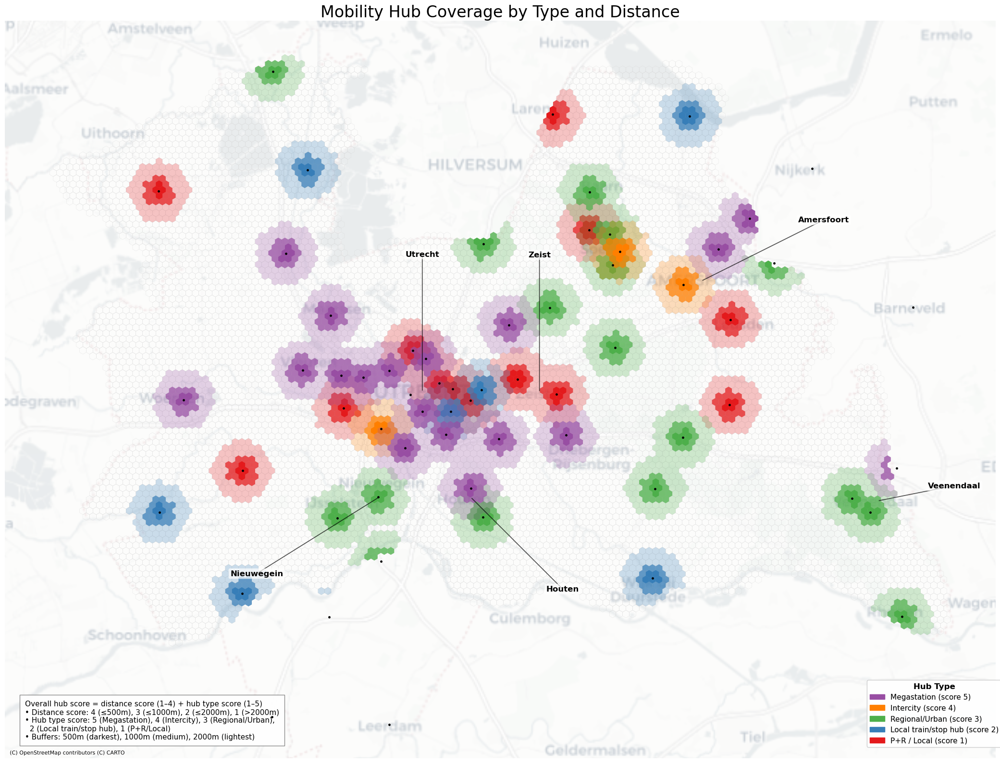

In [44]:
# --- Use global plotting parameters ---
from plotting_globals import (
    FONT_FAMILY,
    TITLE_FONT_SIZE,
    ANNOTATION_FONT_SIZE,
    GLOBAL_CITY_COORDS,
    GLOBAL_CITY_LABEL_OFFSETS,
    GLOBAL_FIGSIZE,
)

import matplotlib.pyplot as plt
from shapely.ops import unary_union
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import os

# Use OUTPUT_DIR from config for export
try:
    from config import OUTPUT_DIR
except ImportError:
    OUTPUT_DIR = "2.0_notebooks/0.0_outputs/mobility_hubs"  # fallback if config not found

# Hub color map (local, as not in globals)
thub_color_map = {
    5: "#984ea3",  # Megastation (purple)
    4: "#ff7f00",  # Intercity (orange)
    3: "#4daf4a",  # Regional / Urban (green)
    2: "#377eb8",  # Local train / stop hub (blue)
    1: "#e41a1c",  # P+R / Local (red)
}

# Use global city coordinates and offsets
city_coords = GLOBAL_CITY_COORDS
label_offsets = GLOBAL_CITY_LABEL_OFFSETS

city_short_labels = {
    "UTRECHT": "Utrecht",
    "Amersfoort": "Amersfoort",
    "Nieuwegein": "Nieuwegein",
    "Houten": "Houten",
    "Zeist": "Zeist",
    "Veenendaal": "Veenendaal"
}

distance_tiers = {
    "500": {"buffer": 500, "weight": 1.0},     # darkest
    "1000": {"buffer": 1000, "weight": 0.70},  # medium
    "2000": {"buffer": 2000, "weight": 0.25}   # light
}

def plot_buffer_gradient_per_hub_type(
    hubs, hex_all_features, 
    export=True, 
    export_folder=None, 
    export_filename="hub_buffer_gradient.png"
):
    font_family = FONT_FAMILY
    title_fontsize = TITLE_FONT_SIZE
    annotation_fontsize = ANNOTATION_FONT_SIZE
    figsize = GLOBAL_FIGSIZE if GLOBAL_FIGSIZE else (20, 12)

    fig, ax = plt.subplots(figsize=figsize)
    
    # Base hexes: plot the boundaries of all hexes
    hex_all_features.boundary.plot(ax=ax, color="lightgray", linewidth=0.2)

    hexes = hex_all_features

    for hub_score in sorted(thub_color_map.keys(), reverse=True):
        hub_color = thub_color_map[hub_score]
        hubs_of_type = hubs[hubs["hub_type_score"] == hub_score]

        if hubs_of_type.empty:
            continue

        for radius_label, tier in distance_tiers.items():
            buffer_geom = unary_union(hubs_of_type.buffer(tier["buffer"]))
            affected_hexes = hexes[hexes.centroid.within(buffer_geom)]
            
            affected_hexes.plot(
                ax=ax,
                facecolor=hub_color,
                edgecolor="none",
                alpha=tier["weight"],
                zorder=2 + hub_score
            )

    # Overlay hubs
    hubs.plot(ax=ax, color="black", markersize=6, zorder=10)

    # Add city labels using city_coords and label_offsets, and draw offset lines
    for city, (x, y) in city_coords.items():
        dx, dy = label_offsets.get(city, (0, 0))
        label = city_short_labels.get(city, city)
        # Draw offset line if offset is not (0,0)
        if dx != 0 or dy != 0:
            ax.annotate(
                "", xy=(x + dx, y + dy), xytext=(x, y),
                arrowprops=dict(arrowstyle="-", color="black", lw=1.2, alpha=0.7),
                zorder=19
            )
        # Plot the offset label (the main label with offset, in black)
        ax.text(
            x + dx, y + dy, label,
            fontsize=annotation_fontsize + 1, fontweight="bold", color="black",
            ha="center", va="center", bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", boxstyle="round,pad=0.2"),
            zorder=20, family=font_family
        )

    # Basemap
    try:
        import contextily as ctx
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=hexes.crs.to_string(), alpha=0.5)
    except Exception as e:
        print(f"⚠️ Basemap error: {e}")

    # --- Custom Legend with Explanation ---
    hub_type_labels = {
        5: "Megastation",
        4: "Intercity",
        3: "Regional/Urban",
        2: "Local train/stop hub",
        1: "P+R / Local"
    }

    # Hub type legend handles (with color)
    hub_handles = [
        mpatches.Patch(
            color=thub_color_map[score], 
            label=f"{hub_type_labels[score]} (score {score})"
        )
        for score in sorted(thub_color_map.keys(), reverse=True)
    ]

    # Compose explanation text
    explanation = (
        "Overall hub score = distance score (1–4) + hub type score (1–5)\n"
        "• Distance score: 4 (≤500m), 3 (≤1000m), 2 (≤2000m), 1 (>2000m)\n"
        "• Hub type score: 5 (Megastation), 4 (Intercity), 3 (Regional/Urban),\n"
        "  2 (Local train/stop hub), 1 (P+R/Local)\n"
        "• Buffers: 500m (darkest), 1000m (medium), 2000m (lightest)"
    )

    # Only one legend for hub types, placed at lower right
    legend1 = ax.legend(
        handles=hub_handles,
        title="Hub Type",
        loc="lower right",
        bbox_to_anchor=(1.01, 0.01),
        frameon=True,
        prop={"size": annotation_fontsize, "family": font_family},
        title_fontproperties={"size": annotation_fontsize + 1, "weight": "bold", "family": font_family}
    )
    ax.add_artist(legend1)

    # Add explanation as a floating text box
    from matplotlib.offsetbox import AnchoredText
    at = AnchoredText(
        explanation,
        loc='lower left',
        prop=dict(size=annotation_fontsize, family=font_family),
        frameon=True,
        pad=0.7,
        borderpad=0.7,
        bbox_to_anchor=(0.01, 0.01),
        bbox_transform=ax.transAxes
    )
    at.patch.set_facecolor("white")
    at.patch.set_alpha(0.92)
    at.patch.set_edgecolor("gray")
    ax.add_artist(at)

    ax.set_title("Mobility Hub Coverage by Type and Distance", fontsize=title_fontsize, family=font_family)
    ax.axis("off")
    plt.tight_layout()
    
    # --- Export to file if requested ---
    if export:
        # Use config OUTPUT_DIR or fallback
        folder = export_folder if export_folder is not None else OUTPUT_DIR
        os.makedirs(folder, exist_ok=True)
        export_path = os.path.join(folder, export_filename)
        fig.savefig(export_path, dpi=200, bbox_inches="tight")
        print(f"Figure exported")

    plt.show()

# Use OUTPUT_DIR from config, and subfolder "mobility_hubs"
output_subfolder = os.path.join(OUTPUT_DIR, "mobility_hubs")
if not os.path.exists(output_subfolder):
    os.makedirs(output_subfolder, exist_ok=True)
plot_buffer_gradient_per_hub_type(hubs, hex_all_features, export=True, export_folder=output_subfolder)


# 3.0 Public Transport Networks (bus, train, tram)

This section summarizes how proximity to **public transport lines** (train, tram, and bus) was integrated into the hex grid as a distance-based access score.

### Modes Included

| **Mode**         | **Dutch Term**         | **Description**                     |
| ---------------- | ---------------------- | ----------------------------------- |
| Train            | *Trein*                | Intercity and local/regional trains |
| Tram             | *Tram*                 | Utrecht region light rail lines     |
| Bus              | *Bus*                  | Local and regional public buses     |
| Express Bus      | *Snelbus / Interliner* | High-speed regional services        |
| Neighborhood Bus | *Buurtbus*             | Small-scale rural bus services      |


* Data source: [Provincie Utrecht Open Data](https://geo-point.provincie-utrecht.nl/)
* Geometry type: **LineString**, representing official PT routes

---

### Distance-Based Scoring

Each hexagon was scored using the **shortest distance** from its centroid to any PT line:

| **Distance to Line** | **pt\_access\_score** |
| -------------------- | --------------------- |
| ≤ 250m               | 4                     |
| ≤ 500m               | 3                     |
| ≤ 1000m              | 2                     |
| ≤ 2000m              | 1                     |
| > 2000m              | 0                     |

> Higher scores indicate **better access** to public transport lines.
> ℹ️ PT access is strongest in the central corridor (Utrecht, Nieuwegein, Zeist), with several rural edges scoring below 2.



In [ ]:
import geopandas as gpd

# Use QGIS_DIR from config (no subfolder, file is directly in QGIS_DIR)
pt_lines_path = QGIS_DIR / "networks_transport_provincial_public.gpkg"

try:
    pt_lines = gpd.read_file(pt_lines_path).to_crs(28992)
    display(pt_lines.head())
    pt_lines.plot()
except Exception as e:
    print(f"Could not load PT lines from {pt_lines_path}")
    print(f"Error: {e}")
    pt_lines = None


In [46]:
# Step 1: Make sure centroids are in the right CRS
hex_all_features["centroid"] = hex_all_features.centroid  # Already exists, just reassigning for clarity

# Step 2: Calculate distance to the nearest PT line
hex_all_features["pt_line_distance"] = hex_all_features["centroid"].apply(
    lambda pt: pt_lines.distance(pt).min()
)


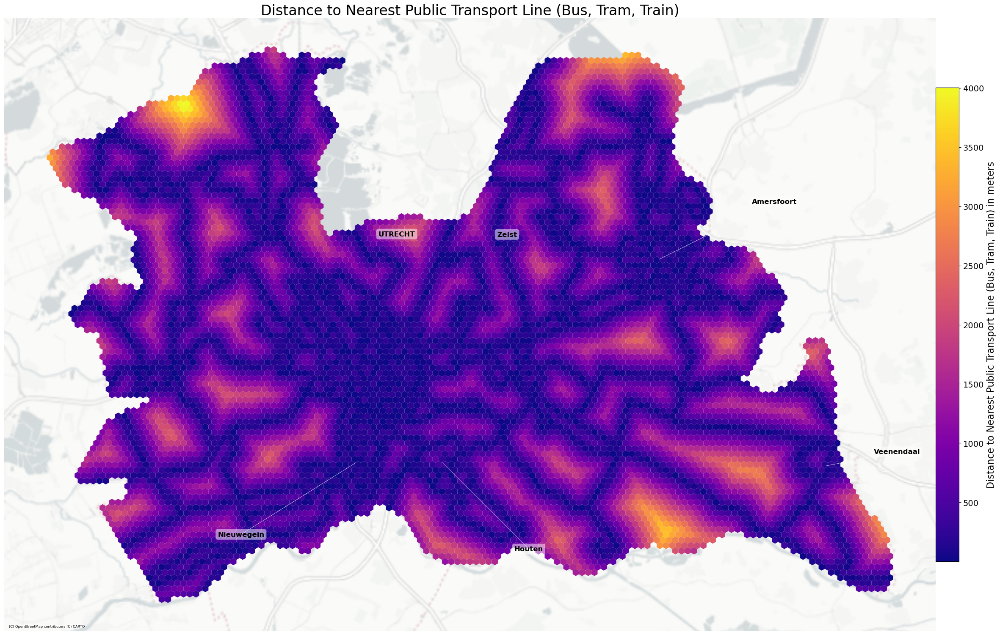

In [47]:
import matplotlib.pyplot as plt
from plotting_globals import FIGSIZE_SINGLE, GLOBAL_TITLE_FONTSIZE, GLOBAL_CITY_COORDS, GLOBAL_CITY_LABEL_OFFSETS
import contextily as ctx
import matplotlib as mpl
import numpy as np

fig, ax = plt.subplots(figsize=FIGSIZE_SINGLE)

# Plot the hex grid
plot = hex_all_features.plot(
    column="pt_line_distance",
    cmap="plasma",
    legend=False,  # Don't use geopandas' built-in legend
    ax=ax,
    edgecolor=None,
    linewidth=0.0
)

plt.title("Distance to Nearest Public Transport Line (Bus, Tram, Train)", fontsize=GLOBAL_TITLE_FONTSIZE)

# Add basemap
ctx.add_basemap(
    ax,
    crs=hex_all_features.crs.to_string(),
    source=ctx.providers.CartoDB.PositronNoLabels,
    attribution_size=6,
    reset_extent=True
)

# Add city labels and lines
for city, (x, y) in GLOBAL_CITY_COORDS.items():
    dx, dy = GLOBAL_CITY_LABEL_OFFSETS.get(city, (0, 0))
    ax.plot([x, x + dx], [y, y + dy], color='white', linewidth=0.5, zorder=10)
    ax.text(
        x + dx, y + dy, city,
        fontsize=12, fontweight='bold', color='black',
        ha='center', va='center',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3', alpha=0.5),
        zorder=11
    )

ax.axis("off")
ax.set_position([0, 0, 1, 1])
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

# --- Custom colorbar (add LAST, after all plotting) ---
vmin = hex_all_features["pt_line_distance"].min()
vmax = hex_all_features["pt_line_distance"].max()
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
sm = mpl.cm.ScalarMappable(cmap="plasma", norm=norm)
sm._A = []

# Place the colorbar outside the map
cbar_ax = fig.add_axes([1, 0.15, 0.025, 0.7])  # [left, bottom, width, height]
cb = plt.colorbar(sm, cax=cbar_ax)
cb.set_label("Distance to Nearest Public Transport Line (Bus, Tram, Train) in meters", fontsize=16)
cb.ax.tick_params(labelsize=14)

plt.show()

In [48]:
def pt_distance_to_score(distance):
    if distance <= 250:
        return 4
    elif distance <= 500:
        return 3
    elif distance <= 1000:
        return 2
    elif distance <= 2000:
        return 1
    else:
        return 0

hex_all_features["pt_access_score"] = hex_all_features["pt_line_distance"].apply(pt_distance_to_score)


In [ ]:
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import contextily as ctx
import os
from config import QGIS_DIR, OUTPUT_DIR
import numpy as np

# Use plotting_globals for parameters, but keep colors as in original
from plotting_globals import (
    FIGSIZE_SINGLE,
    GLOBAL_TITLE_FONTSIZE,
    GLOBAL_CITY_COORDS,
    GLOBAL_CITY_LABEL_OFFSETS
)

# --- Load province boundaries ---
province_boundaries = gpd.read_file(QGIS_DIR / "province_boundaries.gpkg").to_crs(hex_all_features.crs)
if "name" in province_boundaries.columns:
    utrecht_boundary = province_boundaries[province_boundaries["name"].str.lower().str.contains("utrecht")]
else:
    utrecht_boundary = province_boundaries[province_boundaries["provincienaam"].str.lower().str.contains("utrecht")]

# --- Plot ---
fig, ax = plt.subplots(figsize=FIGSIZE_SINGLE)

# Set up bins and labels for discrete legend
score_bins = [1, 2, 3, 4]
hex_all_features["pt_access_score"] = hex_all_features["pt_access_score"].astype(int)

score_tick_labels = [
    "1: ≤ 2000m",
    "2: ≤ 1000m",
    "3: ≤ 500m",
    "4: ≤ 250m"
]

# Plot with categorical colormap and discrete legend (keep colors as in original)
cax = hex_all_features.plot(
    column="pt_access_score",
    ax=ax,
    cmap="plasma_r",
    edgecolor="none",
    alpha=0.8,
    legend=True,
    legend_kwds={
        "label": "PT Access Score\nHigher = better access (closer to PT line)",
        "shrink": 0.6,
        "boundaries": np.arange(0.5, 5.5, 1),
        "ticks": [1, 2, 3, 4],
        "spacing": "proportional"
    },
    vmin=1,
    vmax=4
)

# Manually set the tick labels for the colorbar
cbar = cax.get_figure().axes[-1]
cbar.set_yticklabels(score_tick_labels)

# Province boundary
utrecht_boundary.boundary.plot(ax=ax, color="black", linewidth=1, zorder=10)

# City label annotations using plotting_globals parameters
for city, (x, y) in GLOBAL_CITY_COORDS.items():
    dx, dy = GLOBAL_CITY_LABEL_OFFSETS.get(city, (0, 0))
    ax.annotate(
        city,
        xy=(x, y),
        xytext=(x + dx, y + dy),
        textcoords='data',
        fontsize=GLOBAL_TITLE_FONTSIZE - 10,  # 14 if TITLE_FONT_SIZE=24
        fontweight='bold',
        color='#333333',
        ha='center',
        va='center',
        bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7, ec="none"),
        arrowprops=dict(arrowstyle="->", color="#cccccc", lw=1.2, alpha=0.7)
    )

# Basemap
try:
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=hex_all_features.crs)
except Exception as e:
    print("Basemap error:", e)

# Final layout
ax.set_title(
    "Distance to Nearest Public Transport Line (Bus, Tram, Train) (Scored Version)\nwith Utrecht Province Boundary and Main Cities",
    fontsize=GLOBAL_TITLE_FONTSIZE, pad=15
)
ax.axis("off")
plt.tight_layout()

# Export
output_dir = OUTPUT_DIR / "pt_access"
output_dir.mkdir(parents=True, exist_ok=True)
plt.savefig(output_dir / "pt_access_score_map.png", dpi=300, bbox_inches="tight")
print("✅ Exported pt_access_score_map.png")
plt.show()


# 4.0 Bike networks

In [25]:

from config import QGIS_DIR

bike_direct = gpd.read_file(
    QGIS_DIR / "networks_bike_networks_direct_routes.gpkg"
).to_crs(28992)

bike_regional = gpd.read_file(
    QGIS_DIR / "networks_bike_networks_regional.gpkg"
).to_crs(28992)




In [26]:
def fast_nearest_distance(point, tree):
    idx = tree.nearest(point)
    return point.distance(tree.geometries[idx])


In [27]:
from shapely.strtree import STRtree

# Build spatial indexes for the bike networks
direct_index = STRtree(bike_direct.geometry)
regional_index = STRtree(bike_regional.geometry)

# Use .apply instead of .progress_apply, since GeoSeries does not have progress_apply
hex_all_features["bike_direct_distance"] = hex_all_features["centroid"].apply(
    lambda pt: fast_nearest_distance(pt, direct_index)
)
# repeat for regional and combined
hex_all_features["bike_regional_distance"] = hex_all_features["centroid"].apply(
    lambda pt: fast_nearest_distance(pt, regional_index)
)
# Combine both distances into a single column
hex_all_features["bike_combined_distance"] = hex_all_features[
    ["bike_direct_distance", "bike_regional_distance"]
].min(axis=1)  # Use the minimum distance from either network
# Optional: Clean up temporary columns
hex_all_features = hex_all_features.drop(columns=["bike_direct_distance", "bike_regional_distance"])
# Check the results
hex_all_features[["bike_combined_distance"]].describe() 





,bike_combined_distance
count,8940.000000
mean,613.406760
std,664.807891
min,0.039732
25%,147.963630
50%,378.990462
75%,837.903998
max,4590.630622


In [2]:
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.colors import BoundaryNorm
import matplotlib.patches as mpatches
import numpy as np
import os

# from config import OUTPUT_DIR
OUTPUT_DIR = "output"  # fallback if config.py is missing
from plotting_globals import (
    GLOBAL_FIGSIZE,
    GLOBAL_TITLE_FONTSIZE,
    GLOBAL_CITY_LABEL_FONTSIZE,
    GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT,
    GLOBAL_CITY_COORDS,
    GLOBAL_CITY_LABEL_OFFSETS,
    FONT_FAMILY,
)

# --- Step 1: Create a capped version for better visual contrast ---
hex_all_features["bike_combined_distance_capped"] = hex_all_features["bike_combined_distance"].clip(upper=2500)

# --- Step 2: Set up city labels using global parameters ---
city_coords = GLOBAL_CITY_COORDS
label_offsets = GLOBAL_CITY_LABEL_OFFSETS

# --- Step 3: Plot ---
fig, ax = plt.subplots(figsize=GLOBAL_FIGSIZE)

# Base layer
hex_all_features.plot(
    column="bike_combined_distance_capped",
    cmap="viridis",
    linewidth=0.05,
    edgecolor="grey",
    legend=False,
    ax=ax,
    zorder=1
)

# City labels
for city, (x, y) in city_coords.items():
    dx, dy = label_offsets.get(city, (0, 0))
    fontsize = GLOBAL_CITY_LABEL_FONTSIZE_UTRECHT if city == "UTRECHT" else GLOBAL_CITY_LABEL_FONTSIZE
    ax.annotate(
        city,
        xy=(x, y),
        xytext=(x + dx, y + dy),
        textcoords='data',
        fontsize=fontsize,
        fontweight='bold',
        color='black',
        ha='center',
        va='center',
        bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7, ec="none"),
        arrowprops=dict(arrowstyle="->", color="black", lw=1.1, alpha=0.7),
        fontfamily=FONT_FAMILY,
    )

# Basemap
try:
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=hex_all_features.crs, zorder=0)
except Exception as e:
    print("⚠️ Basemap error:", e)

# Colorbar
sm = plt.cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(vmin=0, vmax=2500))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_label("Distance to Nearest Bike Network (m)", fontsize=GLOBAL_CITY_LABEL_FONTSIZE, fontfamily=FONT_FAMILY)

# Final touches
ax.set_title(
    "Hex Distance to Nearest Bike Network\nwith Utrecht Province Boundary and Main Cities",
    fontsize=GLOBAL_TITLE_FONTSIZE,
    pad=15,
    fontfamily=FONT_FAMILY,
)
ax.axis("off")

# Save figure
bike_dir = OUTPUT_DIR / "cycling"
bike_dir.mkdir(parents=True, exist_ok=True)
plt.savefig(bike_dir / "bike_combined_distance_map.png", dpi=300, bbox_inches="tight")
plt.show()


NameError: name 'hex_all_features' is not defined

### Feature Excluded from Modeling: Bike Network Distance

This feature measured the distance from each hexagon to the nearest point on the **combined bike network** (regional + direct infrastructure). While calculated successfully, it was **excluded from clustering and further modeling** for the following reasons:


| **Reason**                  | **Explanation**                                                              |
| --------------------------- | ---------------------------------------------------------------------------- |
| **Near-universal coverage** | Nearly all hexes in the province are within 500–1000m of the bike network.   |
| **Low spatial contrast**    | Limited variation between hexes; even rural areas are well connected.        |
| **Redundancy**              | Areas without coverage are likely uninhabited or captured by other features. |
| **Limited modeling value**  | Feature would contribute little differentiation in clustering outcomes.      |

> ℹ️ While not used in modeling, the metric can still serve a **visual or contextual role** in reports and dashboards.

In [29]:
# Drop bike network related columns from the main GeoDataFrame

cols_to_drop = []
for col in ["bike_combined_distance", "bike_combined_distance_capped"]:
    if col in hex_all_features.columns:
        cols_to_drop.append(col)
if cols_to_drop:
    hex_all_features = hex_all_features.drop(columns=cols_to_drop)


# Finalize Features and Saves

In [30]:
# Ensure only one geometry column (drop centroid or other geometries if present)
hex_features_final = hex_all_features.copy()

# If 'centroid' exists as a column with geometry, drop or convert it
if "centroid" in hex_features_final.columns:
    hex_features_final = hex_features_final.drop(columns=["centroid"])

hex_features_final = hex_features_final.drop(columns=["ovfiets_access_color"], errors="ignore")


desired_order = [
    "hex_id", "geometry",  # ID + spatial reference up front
    "job_onsite", "job_hybrid", "job_uncertain", "job_weighted",
    "housing_density_utrecht_2025", "absolute_growth_utrecht_2025",
    "planned_housing_units", "planned_density_score",
    "avg_vehicle_availability", "capped_vehicle_availability", "log_vehicle_availability",
    "has_ovfiets_access",
    "hub_distance_score", "hub_type_score", "hub_overall_score",
    "pt_line_distance", "pt_access_score"
]
hex_features_final = hex_features_final[[col for col in desired_order if col in hex_features_final.columns]]



### A step back to this notebook: Feature Transformation for Clustering

Several features used in HDBSCAN clustering were highly skewed and sparse, which was distorting the clustering results — especially in dense urban areas.

To address this, we applied the following transformations:

1. **Logarithmic transformation** (`np.log1p`) to reduce the impact of extreme values while preserving positive order for:
   - `job_weighted`
   - `planned_housing_units`
   - `planned_density_score`

2. **Binary flag creation** (`.astype(int)`) to handle sparse features with over 90% zero values. These were transformed into simple presence/absence indicators:
   - `absolute_growth_utrecht_2025`
   - `housing_density_utrecht_2025`

All transformed features were saved with clear suffixes:
- `_log` for log-transformed features
- `_flag` for binary indicators

These versions will be used in the clustering pipeline to improve spatial coherence and reduce noise in dense areas.

### Drop Unused or Redundant Columns

After applying feature transformations, we are removing columns that are either:
- raw/untransformed versions of the features now used in `_log` or `_flag` form
- redundant, e.g. multiple versions of availability scores or internal geometry columns
- not relevant for clustering (e.g. `centroid`, category labels like `ovfiets_access_color`)



In [50]:
import numpy as np

# 1. Features to apply log1p transformation
log_transform_cols = [
    "job_weighted",
    "planned_housing_units",
    "planned_density_score"
]

for col in log_transform_cols:
    hex_all_features[f"{col}_log"] = np.log1p(hex_all_features[col])
    print(f"Log1p transform applied to '{col}', new column '{col}_log' created.")

print("Log1p transformation complete for columns:", log_transform_cols)

# 2. Features to become binary flags (1 = presence, 0 = absence)
binary_flag_cols = [
    "absolute_growth_utrecht_2025",
    "housing_density_utrecht_2025"
]

for col in binary_flag_cols:
    hex_all_features[f"{col}_flag"] = (hex_all_features[col] > 0).astype(int)
    print(f"Binary flag created for '{col}', new column '{col}_flag' created.")

print("Binary flag creation complete for columns:", binary_flag_cols)

# 3. Quick verification
summary = hex_all_features[[f"{c}_log" for c in log_transform_cols] + 
                           [f"{c}_flag" for c in binary_flag_cols]].describe()
print("Summary statistics for new log and flag columns:")
print(summary)


Log1p transform applied to 'job_weighted', new column 'job_weighted_log' created.
Log1p transform applied to 'planned_housing_units', new column 'planned_housing_units_log' created.
Log1p transform applied to 'planned_density_score', new column 'planned_density_score_log' created.
Log1p transformation complete for columns: ['job_weighted', 'planned_housing_units', 'planned_density_score']
Binary flag created for 'absolute_growth_utrecht_2025', new column 'absolute_growth_utrecht_2025_flag' created.
Binary flag created for 'housing_density_utrecht_2025', new column 'housing_density_utrecht_2025_flag' created.
Binary flag creation complete for columns: ['absolute_growth_utrecht_2025', 'housing_density_utrecht_2025']
Summary statistics for new log and flag columns:
       job_weighted_log  planned_housing_units_log  planned_density_score_log  \
count       8940.000000                8940.000000                8940.000000   
mean           1.826851                   1.653195               

In [52]:
# Check skewness of all numeric features in hex_all_features
numeric_cols = hex_all_features.select_dtypes(include=[np.number]).columns
skewness = hex_all_features[numeric_cols].skew().sort_values(ascending=False)
print("Skewness of numeric features in hex_all_features:")
print(skewness)

# Optionally, show the most skewed features
print("\nMost skewed features (|skew| > 1):")
print(skewness[skewness.abs() > 1])


Skewness of numeric features in hex_all_features:
avg_vehicle_availability             84.685937
hub_type_score                       17.418578
planned_density_score                10.882790
absolute_growth_utrecht_2025         10.769479
capped_vehicle_availability           9.167131
planned_housing_units                 9.093693
log_vehicle_availability              8.797034
job_uncertain                         5.137999
housing_density_utrecht_2025          5.118933
job_hybrid                            4.992900
has_ovfiets_access                    4.855437
job_onsite                            4.798484
job_weighted                          4.693878
absolute_growth_utrecht_2025_flag     3.642240
housing_density_utrecht_2025_flag     3.160350
hub_overall_score                     2.319171
planned_density_score_log             2.274196
hub_distance_score                    1.516257
pt_line_distance                      1.315981
planned_housing_units_log             1.084056
job_weight

In [ ]:
# Columns to drop: raw versions of log/flag features + unused fields
cols_to_drop = [
    "job_onsite", "job_hybrid", "job_uncertain",
    "job_weighted",  # replaced by job_weighted_log
    "housing_density_utrecht_2025",  # replaced by *_flag
    "absolute_growth_utrecht_2025",
    "planned_housing_units", "planned_density_score",  # replaced by *_log
    "avg_vehicle_availability", "capped_vehicle_availability",  # replaced by log_vehicle_availability
    "ovfiets_access_color",  # categorical, not usable directly
    "hub_type_score",  # replaced by hub_overall_score or distance version
    "centroid",  # redundant with geometry
]

# Drop the columns
hex_all_features = hex_all_features.drop(columns=cols_to_drop)

# Optional: check result
hex_all_features.columns.to_list()



In [ ]:

# Export hex_all_features as a GeoPackage to the QGIS_DIR from config.py
output_gpkg_path = QGIS_DIR / "hex_all_features_final_fixes.gpkg"
hex_all_features.to_file(output_gpkg_path, driver="GPKG")
print(f"hex_all_features exported to {output_gpkg_path}")
